# ポテンシャルがある場合の1Dシュレーディンガー方程式の解
一次元系のシュレーディンガー方程式は、
$$
\left( -\frac{\hbar^2}{2m}\frac{d^2}{dx^2} + V(x) \right) \psi(x) = \epsilon \psi(x)
$$
である。
前回はポテンシャル$V(x)$がゼロの場合を解いたが、次はポテンシャルを入れて解いてみよう。

## 前回のおさらい

座標を離散化すると、シュレーディンガー方程式は、
$$
\sum_j \left(
-\frac{\hbar^2}{2m} d_j + V(x_j) \delta_{ij}
\right) \psi(x_j) = \epsilon \psi(x_i)
$$
と書くことができる。  
ここで、
$$
\frac{d^2}{dx^2}\psi |_{x=x_i} \rightarrow \sum_j d_j \psi(x_j) 
$$
である。  
この方程式は、先ほどと同様に行列とベクトルで表現することができて、
$$
\hat{H} {\bf \psi} = \epsilon {\bf \psi}
$$
となる。これがシュレーディンガー方程式の行列表示である。  
ここで、${\bf \psi}_n = U {\bf c}_n$を使えば、
$$
\hat{H} U {\bf c}_n = \epsilon U {\bf c}_n 
$$
$$
U^+ \hat{H} U {\bf c}_n = \epsilon U^+ U {\bf c}_n 
$$
$$
\hat{H}' {\bf c}_n = \epsilon {\bf c}_n
$$
となる。  
ベクトルはユニタリー変換で色々変換できるので、kでもxでも好きな表示で計算できる。  


## 離散化座標表示での解
　実は前回のノートのコードで対応できる。  
### ポテンシャルがない場合
 ポテンシャルを入れる前に、波動関数がどのようになっているか見てみよう。
 方程式は
 $$
\left( -\frac{d^2}{dx'^2} + V(x') \right) \psi(x') = \epsilon \psi(x')
$$
と無次元化されている。
 境界条件も前回と同じ
 $$
 \psi(x_{-1}) = 0
 $$
 $$
 \psi(x_{N+1}) = 0
 $$
である。 

  まず、ハミルトニアンを表す行列を以下のように用意する。

In [1]:
function make_H1d(N,a)
    mat_H = zeros(Float64,N,N)
    vec_V = zeros(Float64,N)
        
    for i in 1:N
        for dx in -1:1
            j = i + dx
            v = 0.0
            if dx == 0
                v = (2/a^2 + vec_V[i])
            elseif dx == 1
                v = -1/a^2
            elseif dx == -1
                v = -1/a^2
            end
            
            if 1 <= j <= N
                mat_H[i,j] = v
            end
            
        end
        
    end
    
    
    return mat_H
end

make_H1d (generic function with 1 method)

最小固有値に属する波動関数を見てみよう。
まず、対角化し、

In [2]:
using LinearAlgebra #対角化のルーチンeigenを呼ぶ準備 v0.7以降必要
N = 1000
a = 0.01
mat_H = make_H1d(N,a)
ε,ψ = eigen(mat_H)

println(ε[1])

0.09849886676979276


最小固有値を得た。次に固有ベクトルをプロットしよう。固有ベクトルの要素の二乗が波動関数の二乗である。

In [3]:
is = 1
println(ψ[:,is])

[0.000140286, 0.00028057, 0.000420851, 0.000561129, 0.0007014, 0.000841665, 0.000981922, 0.00112217, 0.0012624, 0.00140263, 0.00154284, 0.00168303, 0.00182321, 0.00196337, 0.00210351, 0.00224363, 0.00238373, 0.0025238, 0.00266385, 0.00280387, 0.00294387, 0.00308384, 0.00322377, 0.00336368, 0.00350355, 0.00364338, 0.00378319, 0.00392295, 0.00406267, 0.00420236, 0.004342, 0.0044816, 0.00462116, 0.00476067, 0.00490014, 0.00503955, 0.00517892, 0.00531823, 0.0054575, 0.0055967, 0.00573586, 0.00587496, 0.006014, 0.00615298, 0.0062919, 0.00643075, 0.00656955, 0.00670828, 0.00684694, 0.00698554, 0.00712407, 0.00726252, 0.00740091, 0.00753922, 0.00767746, 0.00781562, 0.00795371, 0.00809172, 0.00822965, 0.00836749, 0.00850526, 0.00864294, 0.00878053, 0.00891804, 0.00905546, 0.0091928, 0.00933004, 0.00946719, 0.00960424, 0.0097412, 0.00987807, 0.0100148, 0.0101515, 0.0102881, 0.0104245, 0.0105609, 0.0106972, 0.0108333, 0.0109694, 0.0111053, 0.0112412, 0.0113769, 0.0115125, 0.011648, 0.0117834, 0.

In [4]:
using Plots
gr()

Plots.GRBackend()

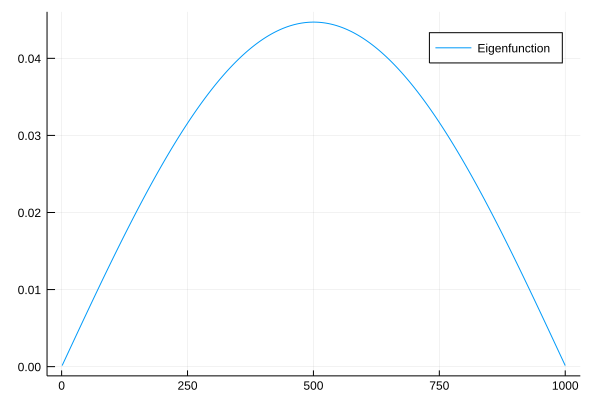

In [5]:
xaxis = Int64[]
for i in 1:N
    push!(xaxis,i)
end

is = 1
plot(xaxis[1:N],ψ[1:N,is],label="Eigenfunction") 

見てわかるように、前回解いた時に得られた
$$
\psi(x) = 2 i C_1 \sin  \frac{\pi}{L} x
$$
と等しい。ここで、$L = (N+1)*a$である（境界条件をみよ）。
プロットすると、

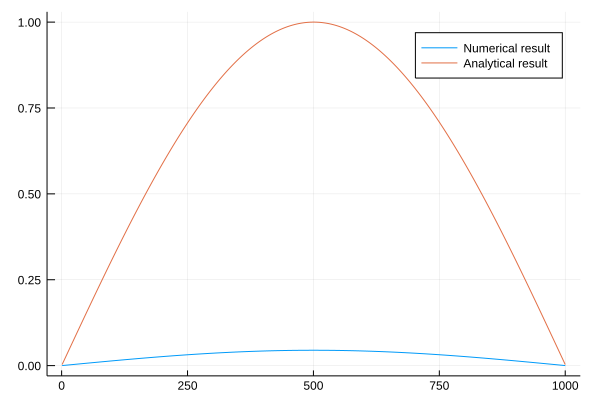

In [6]:
aψ = zeros(Float64,N)
for i in 1:N
    xi = i*a
    aψ[i] = sin(xi*π/((N+1)*a))
end

is = 1
plot(xaxis[1:N],[ψ[1:N,is],aψ[1:N]],label=["Numerical result","Analytical result"]) 

あれ、値がずれてしまった。これは、シュレーディンガー方程式の解は定数倍も解であるためである。  
数値的に得られた解は

In [27]:
sum(dot(ψ[1:N,is],ψ[1:N,is]))

0.9999999999999992

内積をとると1に規格化されている。この内積は全空間での粒子を見出す確率であるので、まさに規格化条件となっている。  
解析解の方も規格化を行うと、

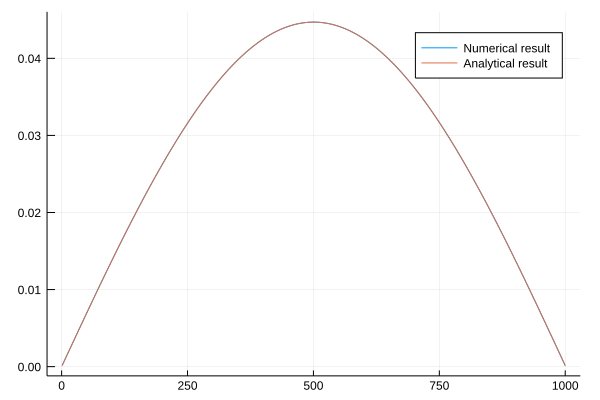

In [8]:
aψ = zeros(Float64,N)
for i in 1:N
    xi = i*a
    aψ[i] = sin(xi*π/((N+1)*a))
end
C = sum(dot(aψ[1:N],aψ[1:N]))
aψ = aψ/sqrt(C)
is = 1
plot(xaxis[1:N],[ψ[1:N,is],aψ[1:N]],label=["Numerical result","Analytical result"]) 

となり、完全に一致する。

ポテンシャルがない場合の解を、複数描くと、

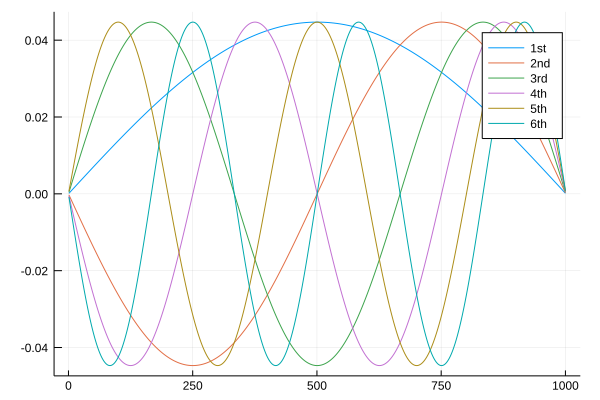

In [9]:
plot(xaxis[1:N],ψ[1:N,1:6],label=["1st","2nd","3rd","4th","5th","6th"]) 

どれもsin関数である。

### ポテンシャルがある場合
ポテンシャルがある場合を考えよう。まず、ポテンシャルを定義する。

In [10]:
function calc_V(N,V0)
    vec_V = zeros(Float64,N)
    dx = N/6
    for i in 1:N
        if N/2 - dx <= i <= N/2 + dx
            vec_V[i] = V0
        end
    end
    return vec_V
end

calc_V (generic function with 1 method)

ここでは、$N/2 - dx \le i \le N/2 + dx$の範囲にポテンシャル$V0$があることにした。

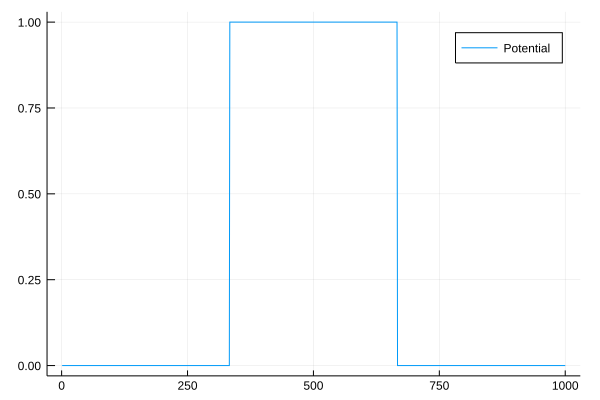

In [11]:
xaxis = Int64[]
for i in 1:N
    push!(xaxis,i)
end

V0=1.0
vec_V = calc_V(N,V0)
plot(xaxis[1:N],vec_V[1:N],label="Potential") 

このポテンシャルがある場合の最小固有値とその固有関数を見てみよう。  
そのために、ハミルトニアンを定義する。

In [12]:
function make_H1dv(N,a,V0)
    mat_H = zeros(Float64,N,N)
    vec_V = calc_V(N,V0)
        
    for i in 1:N
        for dx in -1:1
            j = i + dx
            v = 0.0
            if dx == 0
                v = (2/a^2 + vec_V[i])
            elseif dx == 1
                v = -1/a^2
            elseif dx == -1
                v = -1/a^2
            end
            
            if 1 <= j <= N
                mat_H[i,j] = v
            end
            
        end
        
    end
    
    
    return mat_H
end

make_H1dv (generic function with 1 method)

0.47212647457743806


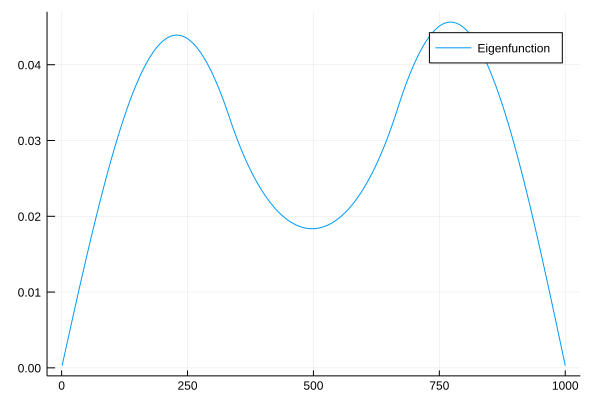

In [13]:
N = 1000
a = 0.01
V0 = 1.0
mat_H = make_H1dv(N,a,V0)
ε,ψ = eigen(mat_H)

println(ε[1])
is = 1
plot(xaxis[1:N],ψ[1:N,is],label="Eigenfunction") 

ポテンシャルによって、波動関数が凹んでいることがわかる。当然、その二乗である存在確率も低くなっている。  
次に、ポテンシャルの強度を変えてみよう。

In [28]:

N = 1000
a = 0.01
function gs1(N,a)
    groundstates = []
    labels = []
    for v in 1:10
        V0 = v*0.5
        mat_H = make_H1dv(N,a,V0)
        ε,ψ = eigen(mat_H)
        println("Potential = ",V0," Minimum eigenvalue = ",ε[1])
        push!(groundstates,ψ[:,1])
        push!(labels,string(V0))
    end   
    return groundstates,labels
end
roundstates,labels = gs1(N,a)


Potential = 0.5 Minimum eigenvalue = 0.3216680437594529
Potential = 1.0 Minimum eigenvalue = 0.47497702625749055
Potential = 1.5 Minimum eigenvalue = 0.5788014430373154
Potential = 2.0 Minimum eigenvalue = 0.6539436690715744
Potential = 2.5 Minimum eigenvalue = 0.7126667576418749
Potential = 3.0 Minimum eigenvalue = 0.7613285627430311
Potential = 3.5 Minimum eigenvalue = 0.8033158575112843
Potential = 4.0 Minimum eigenvalue = 0.8405613523837149
Potential = 4.5 Minimum eigenvalue = 0.8742498997697548
Potential = 5.0 Minimum eigenvalue = 0.905155534659135


(Any[[0.000217098, 0.000434188, 0.000651265, 0.000868321, 0.00108535, 0.00130234, 0.00151929, 0.00173619, 0.00195304, 0.00216982  …  0.00216982, 0.00195304, 0.00173619, 0.00151929, 0.00130234, 0.00108535, 0.000868321, 0.000651265, 0.000434188, 0.000217098], [0.000288326, 0.000576638, 0.000864923, 0.00115317, 0.00144136, 0.00172948, 0.00201751, 0.00230546, 0.00259329, 0.002881  …  0.002881, 0.00259329, 0.00230546, 0.00201751, 0.00172948, 0.00144136, 0.00115317, 0.000864923, 0.000576638, 0.000288326], [0.000340863, 0.000681706, 0.00102251, 0.00136325, 0.00170392, 0.00204449, 0.00238493, 0.00272524, 0.0030654, 0.00340537  …  0.00340537, 0.0030654, 0.00272524, 0.00238493, 0.00204449, 0.00170392, 0.00136325, 0.00102251, 0.000681706, 0.000340863], [0.000378239, 0.000756453, 0.00113462, 0.00151271, 0.0018907, 0.00226857, 0.00264629, 0.00302383, 0.00340118, 0.00377831  …  0.00377831, 0.00340118, 0.00302383, 0.00264629, 0.00226857, 0.0018907, 0.00151271, 0.00113462, 0.000756453, 0.000378239], [

対角化できたので、プロットしてみる。

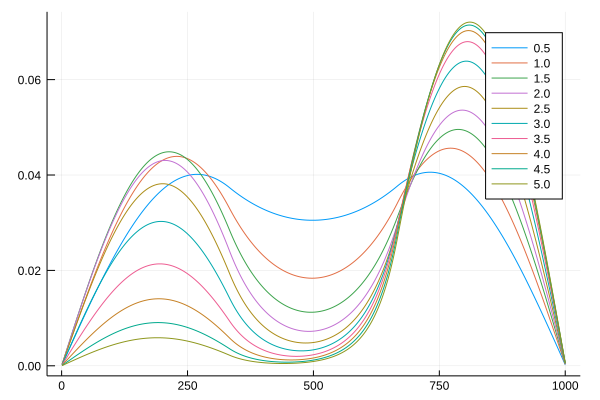

In [15]:
plot(xaxis[1:N],groundstates,label=labels) 

本来、左右対称に出るべきもののような気がするが、なぜ非対称になってしまったのだろうか？  
ポテンシャルを少し変えてみる。

In [16]:
function calc_V(N,V0)
    vec_V = zeros(Float64,N)
    dx = N/6
    center = (N+1)/2
    for i in 1:N
        if center - dx <= i <= center + dx
            vec_V[i] = V0
        end
    end
    return vec_V
end



calc_V (generic function with 1 method)

0.905155534659135


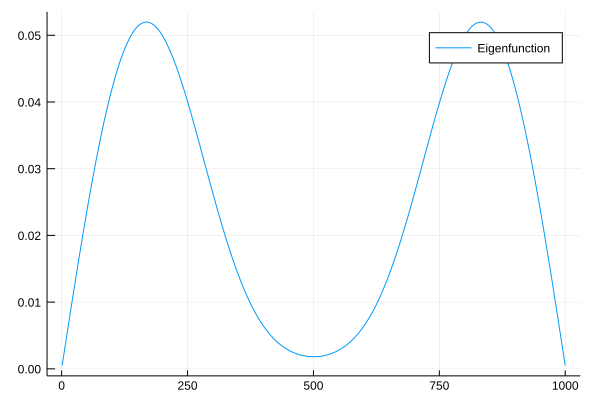

In [29]:
N = 1000
a = 0.01
V0 = 5.0
mat_H = make_H1dv(N,a,V0)
ε,ψ = eigen(mat_H)

println(ε[1])
is = 1
plot(xaxis[1:N],ψ[1:N,is],label="Eigenfunction") 

ほとんど左右対称になった。しかし、このくらいの微小なちがいでなぜこんなに変化してしまったのだろうか。  
その謎は、$a$の大きさにある。ポテンシャルをもとの定義にして、$a$の大きさを半分にしてみよう。

In [18]:
function calc_V(N,V0)
    vec_V = zeros(Float64,N)
    dx = N/6
    center = (N)/2
    for i in 1:N
        if center - dx <= i <= center + dx
            vec_V[i] = V0
        end
    end
    return vec_V
end


calc_V (generic function with 1 method)

0.682351937176906


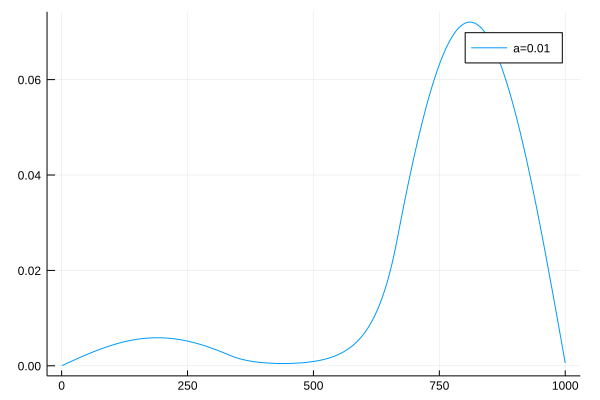

In [19]:
N = 1000
a = 0.01
V0 = 5.0
mat_H = make_H1dv(N,a,V0)
ε,ψ = eigen(mat_H)
println(ε[1])
plot(xaxis[1:N],ψ[1:N,1],label="a=0.01") 


0.682351937176906


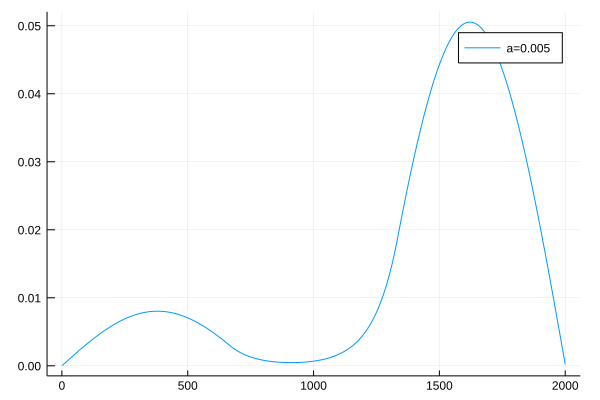

In [20]:
N = 1000*2
xaxis = Int64[]
for i in 1:N
    push!(xaxis,i)
end


a = 0.01/2
V0 = 5.0
mat_H = make_H1dv(N,a,V0)
println(ε[1])
ε,ψ = eigen(mat_H)
plot(xaxis[1:N],ψ[1:N,1],label="a=0.005") 

みてわかるように、$a$の大きさを小さくすると左右の均衡が少し改善された。  
つまり、数値計算上のエラーであることがわかる。$a$が小さくなればさらに改善されるだろう。  矩形ポテンシャルをきちんと中心においた場合$center = (L+1)/2$であれば、改善される。
このような違いは、矩形のポテンシャルに不連続な変化があるからである。いま、差分化している微分演算子の精度が悪いのである。  
これを確認するために、ポテンシャルの形状をなだらかにしてみよう。

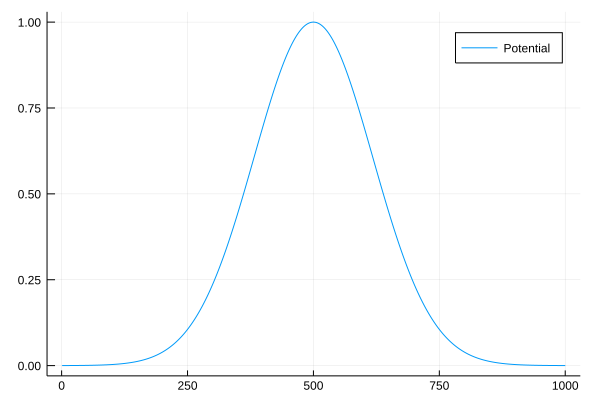

In [21]:
function calc_V(N,V0)
    vec_V = zeros(Float64,N)
    dx = N/6
    center = (N)/2
    for i in 1:N
        vec_V[i] = V0*exp(-(i-center)^2/(dx^2))
    end
    return vec_V
end

N = 1000
xaxis = Int64[]
for i in 1:N
    push!(xaxis,i)
end

V0=1.0
vec_V = calc_V(N,V0)
plot(xaxis[1:N],vec_V[1:N],label="Potential") 


ポテンシャルを、上のようにガウス関数にした。このとき、最小固有値の固有関数は

In [30]:
N = 1000
a = 0.01
function gs2(N,a)
    groundstates = []
    labels = []
    for v in 1:10
        V0 = v*0.5
        mat_H = make_H1dv(N,a,V0)
        ε,ψ = eigen(mat_H)
        println("Potential = ",V0," Minimum eigenvalue = ",ε[1])
        push!(groundstates,ψ[:,1])
        push!(labels,string(V0))
    end    
    return groundstates,labels
end
groundstates,labels = gs2(N,a)

Potential = 0.5 Minimum eigenvalue = 0.3216680437594529
Potential = 1.0 Minimum eigenvalue = 0.47497702625749055
Potential = 1.5 Minimum eigenvalue = 0.5788014430373154
Potential = 2.0 Minimum eigenvalue = 0.6539436690715744
Potential = 2.5 Minimum eigenvalue = 0.7126667576418749
Potential = 3.0 Minimum eigenvalue = 0.7613285627430311
Potential = 3.5 Minimum eigenvalue = 0.8033158575112843
Potential = 4.0 Minimum eigenvalue = 0.8405613523837149
Potential = 4.5 Minimum eigenvalue = 0.8742498997697548
Potential = 5.0 Minimum eigenvalue = 0.905155534659135


(Any[[0.000217098, 0.000434188, 0.000651265, 0.000868321, 0.00108535, 0.00130234, 0.00151929, 0.00173619, 0.00195304, 0.00216982  …  0.00216982, 0.00195304, 0.00173619, 0.00151929, 0.00130234, 0.00108535, 0.000868321, 0.000651265, 0.000434188, 0.000217098], [0.000288326, 0.000576638, 0.000864923, 0.00115317, 0.00144136, 0.00172948, 0.00201751, 0.00230546, 0.00259329, 0.002881  …  0.002881, 0.00259329, 0.00230546, 0.00201751, 0.00172948, 0.00144136, 0.00115317, 0.000864923, 0.000576638, 0.000288326], [0.000340863, 0.000681706, 0.00102251, 0.00136325, 0.00170392, 0.00204449, 0.00238493, 0.00272524, 0.0030654, 0.00340537  …  0.00340537, 0.0030654, 0.00272524, 0.00238493, 0.00204449, 0.00170392, 0.00136325, 0.00102251, 0.000681706, 0.000340863], [0.000378239, 0.000756453, 0.00113462, 0.00151271, 0.0018907, 0.00226857, 0.00264629, 0.00302383, 0.00340118, 0.00377831  …  0.00377831, 0.00340118, 0.00302383, 0.00264629, 0.00226857, 0.0018907, 0.00151271, 0.00113462, 0.000756453, 0.000378239], [

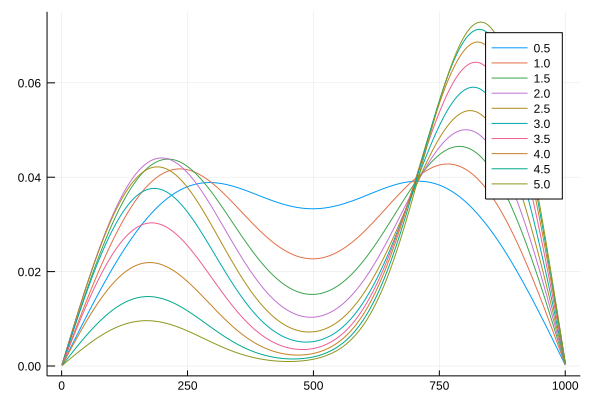

In [23]:
plot(xaxis[1:N],groundstates,label=labels) 

先ほどよりもましになったが、相変わらず$V0=5$では、左右対称が崩れてしまっている。これは、ポテンシャルの変化が急激すぎることに起因している。最後に、ポテンシャルの中心を厳密に系の中心とおくと

In [24]:
function calc_V(N,V0)
    vec_V = zeros(Float64,N)
    dx = N/6
    center = (N+1)/2
    for i in 1:N
        vec_V[i] = V0*exp(-(i-center)^2/(dx^2))
    end
    return vec_V
end


calc_V (generic function with 1 method)

In [32]:
N = 1000
a = 0.01
function gs3(N,a)
    groundstates = []
    labels = []
    for v in 1:10
        V0 = v*0.5
        mat_H = make_H1dv(N,a,V0)
        ε,ψ = eigen(mat_H)
        println("Potential = ",V0," Minimum eigenvalue = ",ε[1])
        push!(groundstates,ψ[:,1])
        push!(labels,string(V0))
    end    
    return groundstates,labels
end
groundstates,labels = gs3(N,a)

Potential = 0.5 Minimum eigenvalue = 0.3216680437594529
Potential = 1.0 Minimum eigenvalue = 0.47497702625749055
Potential = 1.5 Minimum eigenvalue = 0.5788014430373154
Potential = 2.0 Minimum eigenvalue = 0.6539436690715744
Potential = 2.5 Minimum eigenvalue = 0.7126667576418749
Potential = 3.0 Minimum eigenvalue = 0.7613285627430311
Potential = 3.5 Minimum eigenvalue = 0.8033158575112843
Potential = 4.0 Minimum eigenvalue = 0.8405613523837149
Potential = 4.5 Minimum eigenvalue = 0.8742498997697548
Potential = 5.0 Minimum eigenvalue = 0.905155534659135


(Any[[0.000217098, 0.000434188, 0.000651265, 0.000868321, 0.00108535, 0.00130234, 0.00151929, 0.00173619, 0.00195304, 0.00216982  …  0.00216982, 0.00195304, 0.00173619, 0.00151929, 0.00130234, 0.00108535, 0.000868321, 0.000651265, 0.000434188, 0.000217098], [0.000288326, 0.000576638, 0.000864923, 0.00115317, 0.00144136, 0.00172948, 0.00201751, 0.00230546, 0.00259329, 0.002881  …  0.002881, 0.00259329, 0.00230546, 0.00201751, 0.00172948, 0.00144136, 0.00115317, 0.000864923, 0.000576638, 0.000288326], [0.000340863, 0.000681706, 0.00102251, 0.00136325, 0.00170392, 0.00204449, 0.00238493, 0.00272524, 0.0030654, 0.00340537  …  0.00340537, 0.0030654, 0.00272524, 0.00238493, 0.00204449, 0.00170392, 0.00136325, 0.00102251, 0.000681706, 0.000340863], [0.000378239, 0.000756453, 0.00113462, 0.00151271, 0.0018907, 0.00226857, 0.00264629, 0.00302383, 0.00340118, 0.00377831  …  0.00377831, 0.00340118, 0.00302383, 0.00264629, 0.00226857, 0.0018907, 0.00151271, 0.00113462, 0.000756453, 0.000378239], [

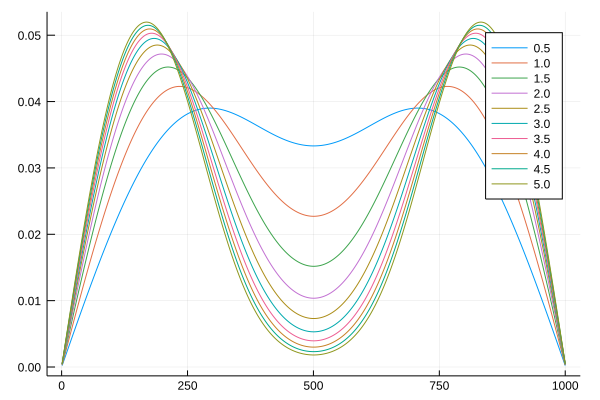

In [26]:
plot(xaxis[1:N],groundstates,label=labels) 

きれいに左右対称になった。このことから、厳密に左右対称なものが欲しい場合には、数値計算でもきちんと左右対称にすべきであることがわかる。